In [11]:
import numpy as np
import pandas as pd 
import random
import os
from glob import glob

import matplotlib.pyplot as plt
from matplotlib import rc
import seaborn as sns
from pylab import rcParams

from sklearn.model_selection import train_test_split
from pathlib import Path
import cv2
import torch
import torchvision

from tqdm.auto import tqdm
import PIL.Image as Image
from IPython.display import display


%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='white', palette='muted', font_scale=1.2)
rcParams['figure.figsize'] = 16, 10

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    
seed_everything(42)

print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject


Using torch 1.7.1 _CudaDeviceProperties(name='GeForce GTX 1060 6GB', major=6, minor=1, total_memory=6144MB, multi_processor_count=10)


# CrowdAI dataset
The dataset includes driving in Mountain View California and neighboring cities during daylight conditions. It contains over 65,000 labels across 9,423 frames collected from a Point Grey research cameras running at full resolution of 1920x1200 at 2hz. The dataset was annotated by CrowdAI using a combination of machine learning and humans.

Can be downloaded from [here](https://github.com/udacity/self-driving-car/tree/master/annotations).

In [28]:
DATA_PATH = './'
IMAGES_PATH = f'{DATA_PATH}object-detection-crowdai/'
LABELS_PATH = f'{DATA_PATH}labels_crowdai.csv'


IMAGE_SIZE = (1200, 1920) # H,W

In [3]:
df = pd.read_csv(LABELS_PATH)
image_ids = df['Frame'].unique().tolist()
df.head(5)

,xmin,ymin,xmax,ymax,Frame,Label,Preview URL
0,785,533,905,644,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
1,89,551,291,680,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
2,268,546,383,650,1479498371963069978.jpg,Car,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
3,455,522,548,615,1479498371963069978.jpg,Truck,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...
4,548,522,625,605,1479498371963069978.jpg,Truck,http://crowdai.com/images/Wwj-gorOCisE7uxA/vis...


In [4]:
# sanity check
l1 = [x.split('/')[-1] for x in glob(f"{IMAGES_PATH}*.jpg")]
l3 = [value for value in l1 if value in image_ids]
assert len(set(l3) - set(image_ids)) == 0 

# Clean Data
The dataset contains the labels (car,truck and padestrian) so we should remove unwanted lables, becuase this model should predict vehicles. 

In [5]:
# REMOVE UNWANTED LABLES
df = df[df['Label'] != 'Pedestrian']
df['Label'].unique()

#Change to one class 
df['Label'] = 'car'

df = df[['Frame','xmin','ymin','xmax','ymax','Label']]

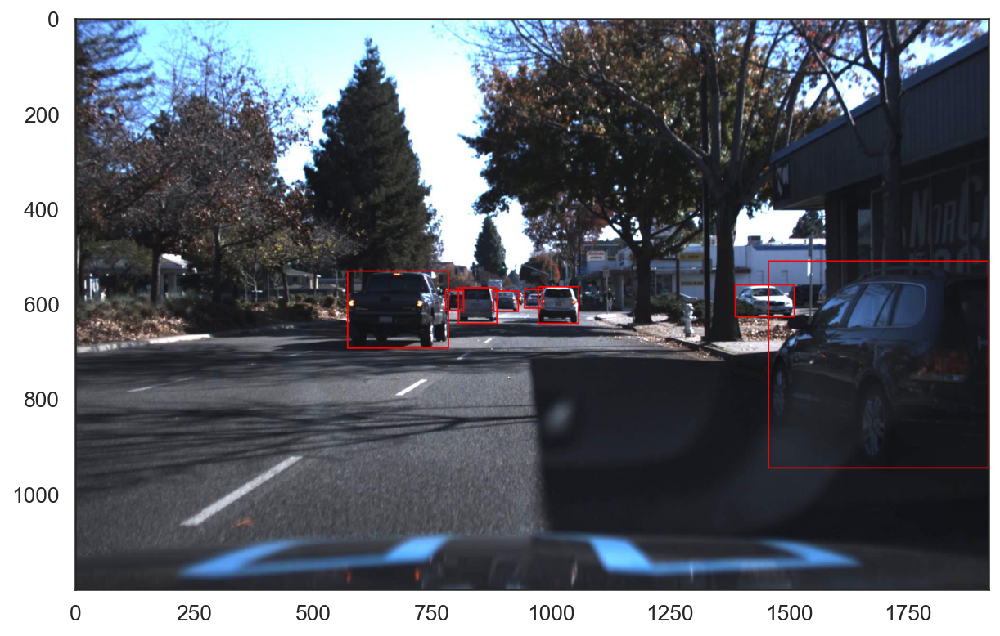

In [6]:
plt.figure(figsize=[10,10])
id = image_ids[300]
im = IMAGES_PATH+id
im = plt.imread(im)
bboxes = df[df['Frame'] == id][['xmin','ymin','xmax','ymax']].to_numpy()

for bbox in bboxes:
    im = cv2.rectangle(im,(bbox[0],bbox[1]),(bbox[2],bbox[3]),(255,0,0),2)
    
plt.imshow(im)
plt.show()

# Convert to YOLO format
**YOLO v5** requires the dataset to be in the darknet format. Here’s an outline of what it looks like:

* One txt with labels file per image
* One row per object
* Each row contains: `class_index bbox_x_center bbox_y_center bbox_width bbox_height`
* Box coordinates must be normalized between 0 and 1
Let’s create a helper function that builds a dataset in the correct format for us

In [14]:
image_ids = image_ids[:2000] # won't be using all of the data

In [15]:
# Data Split
train, val = train_test_split(image_ids, test_size=0.1)
len(train), len(val), len(train)+len(val)

(1800, 200, 2000)

In [16]:
def create_dataset(cars, dataset_type='train'):

    images_path = Path(f"cars/images/{dataset_type}")
    images_path.mkdir(parents=True, exist_ok=True)
    labels_path = Path(f"cars/labels/{dataset_type}")
    labels_path.mkdir(parents=True, exist_ok=True)
    
    h,w = IMAGE_SIZE[:2]
    for idx, img_id in enumerate(tqdm(cars)):
        category = 0
        image_name = f"{idx}.jpg"
        img = Image.open(IMAGES_PATH+img_id)
        img = img.convert("RGB")
        img.save(f'{images_path}/{image_name}', "JPEG")
        label_name = f"{idx}.txt"
        
        with (labels_path/label_name).open(mode="w") as label_file:
            bboxes = df[df['Frame'] == img_id][['xmin','ymin','xmax','ymax']].to_numpy()
            for bbox in bboxes:
                x1, y1 = bbox[0] / w, bbox[1] / h
                x2, y2 = bbox[2] / w, bbox[3] / h
                bbox_width = x2 - x1
                bbox_height = y2 - y1
                label_file.write(f"{category} {x1 + bbox_width / 2} {y1 + bbox_height / 2} {bbox_width} {bbox_height}\n")


In [ ]:
# create_dataset(train)
# create_dataset(val,'val')

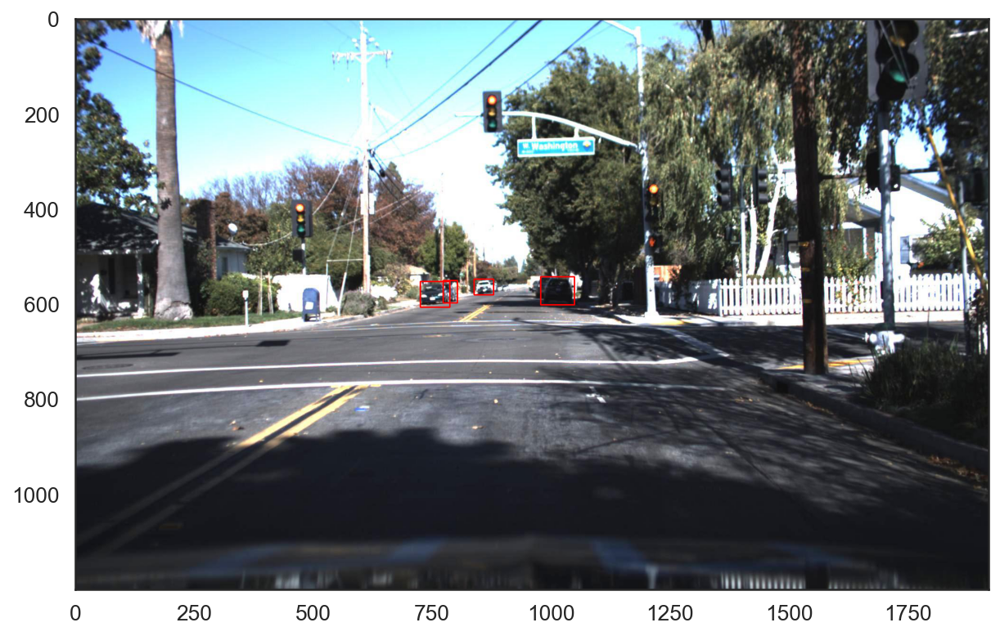

In [7]:
# sanity check
H,W = IMAGE_SIZE[:2]
plt.figure(figsize=[10,10])
id = 0

bboxes = [] 

with open(f'cars/labels/train/{id}.txt', 'r') as f:
    lines = f.readlines()
    for line in lines:
        bboxes.append([float(x) for x in line.rstrip('\n').split(' ')[1:]])

im = plt.imread(f'cars/images/train/{id}.jpg')
for bbox in bboxes:
    xc,yc,wb,hb = bbox
    x1 = int((xc - wb/2)*W)
    y1 = int((yc - hb/2)*H)
    x2 = int((xc + wb/2)*W)
    y2 = int((yc + hb/2)*H)
    im = cv2.rectangle(im, (x1,y1), (x2,y2), (255,0,0), 2)

plt.imshow(im)
plt.show()

# YOLO v5
---
YOLOv5 is a family of compound-scaled object detection models trained on COCO 2017, and includes built-in functionality for Test Time Augmentation (TTA), Model Ensembling, Rectangular Inference, Hyperparameter Evolution.

# YOLO v5 project setup

In [ ]:
# clone repo
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5
# install dependencies
%pip install -qr requirements.txt  

# Training 
on the original run I trained the model for 30 epochs but for the now i will run it 5 epochs.
In addition I used Apex (by nvidia) to speed up the training. 
* For more information https://github.com/nvidia/apex



To train a model on a custom dataset, we’ll call the train.py script. We’ll pass a couple of parameters:

* img 640 - resize the images to 640x640 pixels
* batch 4 - 4 images per batch
* epochs n - train for n epochs
* data ./data/vehicle.yaml - path to dataset config
* cfg ./models/yolov5x.yaml - model config
* weights yolov5x.pt - use pre-trained weights from the YOLOv5x model
* name yolov5x_vehicles - name of our model
* cache - cache dataset images for faster training

Before runing the script few edits should be done:
* **Create vehicle.yaml file**
 - on ./yolov5/data directory
 >`
train: ../cars/images/train/ #path to train images
val: ../cars/images/val/ #path to val images
nc: 1
names:
  ["Vehicle"]`

* **Edit yolov5x.yaml**
 - on ./models/yolov5x.yaml
 >Change nc value from 80 to 1 (only one class)


In [3]:
!python train.py --img 640 --batch 2 --epochs 5 \
  --data ./data/vehicle.yaml --cfg ./models/yolov5x.yaml --weights yolov5x.pt\
  --name yolo5x_cars --cache

github: Command 'git rev-list $(git rev-parse --abbrev-ref HEAD)..origin/master --count' returned non-zero exit status 128.
Plotting labels... 

autoanchor: Analyzing anchors... anchors/target = 4.70, Best Possible Recall (BPR) = 0.9998
                 all         200    1.28e+03       0.203       0.947       0.727       0.348
                 all         200    1.28e+03       0.276       0.944       0.742       0.365
                 all         200    1.28e+03       0.152       0.963       0.757       0.267
                 all         200    1.28e+03       0.558        0.95       0.933       0.527
                 all         200    1.28e+03       0.641       0.944       0.935       0.566
Optimizer stripped from runs\train\yolo5x_cars4\weights\last.pt, 175.1MB
Optimizer stripped from runs\train\yolo5x_cars4\weights\best.pt, 175.1MB


fatal: ambiguous argument '$(git': unknown revision or path not in the working tree.
Use '--' to separate paths from revisions, like this:
'git <command> [<revision>...] -- [<file>...]'
YOLOv5 v4.0-14-gb75c432 torch 1.7.1 CUDA:0 (GeForce GTX 1060 6GB, 6144.0MB)

Namespace(adam=False, batch_size=2, bucket='', cache_images=True, cfg='./models/yolov5x.yaml', data='./data/vehicle.yaml', device='', epochs=5, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolo5x_cars', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs\\train\\yolo5x_cars4', single_cls=False, sync_bn=False, total_batch_size=2, weights='yolov5x.pt', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard --logdir runs/tr

       0/4     3.26G    0.1062   0.06398         0    0.1702        22       640:  20%|##        | 182/900 [01:49<06:45,  1.77it/s]
       0/4     3.26G    0.1062   0.06398         0    0.1702        22       640:  20%|##        | 183/900 [01:49<06:40,  1.79it/s]
       0/4     3.26G    0.1062   0.06375         0    0.1699         2       640:  20%|##        | 183/900 [01:50<06:40,  1.79it/s]
       0/4     3.26G    0.1062   0.06375         0    0.1699         2       640:  20%|##        | 184/900 [01:50<06:50,  1.74it/s]
       0/4     3.26G    0.1061   0.06401         0    0.1701        42       640:  20%|##        | 184/900 [01:51<06:50,  1.74it/s]
       0/4     3.26G    0.1061   0.06401         0    0.1701        42       640:  21%|##        | 185/900 [01:51<06:43,  1.77it/s]
       0/4     3.26G     0.106   0.06421         0    0.1702        41       640:  21%|##        | 185/900 [01:51<06:43,  1.77it/s]
       0/4     3.26G     0.106   0.06421         0    0.1702        41      

       0/4     3.26G   0.08794   0.06679         0    0.1547        14       640:  48%|####7     | 431/900 [04:09<04:18,  1.81it/s]
       0/4     3.26G   0.08787   0.06671         0    0.1546        12       640:  48%|####7     | 431/900 [04:10<04:18,  1.81it/s]
       0/4     3.26G   0.08787   0.06671         0    0.1546        12       640:  48%|####8     | 432/900 [04:10<04:17,  1.82it/s]
       0/4     3.26G   0.08782   0.06665         0    0.1545        27       640:  48%|####8     | 432/900 [04:10<04:17,  1.82it/s]
       0/4     3.26G   0.08782   0.06665         0    0.1545        27       640:  48%|####8     | 433/900 [04:10<04:25,  1.76it/s]
       0/4     3.26G   0.08777   0.06663         0    0.1544        29       640:  48%|####8     | 433/900 [04:11<04:25,  1.76it/s]
       0/4     3.26G   0.08777   0.06663         0    0.1544        29       640:  48%|####8     | 434/900 [04:11<04:21,  1.78it/s]
       0/4     3.26G   0.08771   0.06659         0    0.1543        32      

       1/4     3.26G   0.06302   0.03711         0    0.1001        49       640:  49%|####9     | 443/900 [04:04<04:10,  1.83it/s]
       1/4     3.26G   0.06302   0.03711         0    0.1001        27       640:  49%|####9     | 443/900 [04:05<04:10,  1.83it/s]
       1/4     3.26G   0.06302   0.03711         0    0.1001        27       640:  49%|####9     | 444/900 [04:05<04:09,  1.83it/s]
       1/4     3.26G   0.06301   0.03715         0    0.1002        39       640:  49%|####9     | 444/900 [04:05<04:09,  1.83it/s]
       1/4     3.26G   0.06301   0.03715         0    0.1002        39       640:  49%|####9     | 445/900 [04:05<04:18,  1.76it/s]
       1/4     3.26G     0.063   0.03717         0    0.1002        29       640:  49%|####9     | 445/900 [04:06<04:18,  1.76it/s]
       1/4     3.26G     0.063   0.03717         0    0.1002        29       640:  50%|####9     | 446/900 [04:06<04:15,  1.78it/s]
       1/4     3.26G   0.06301   0.03718         0    0.1002        35      

       1/4     3.26G   0.06189   0.03697         0   0.09886        31       640:  81%|########  | 726/900 [06:41<01:35,  1.82it/s]
       1/4     3.26G   0.06189   0.03697         0   0.09886        31       640:  81%|########  | 727/900 [06:41<01:35,  1.82it/s]
       1/4     3.26G    0.0619   0.03697         0   0.09887        29       640:  81%|########  | 727/900 [06:42<01:35,  1.82it/s]
       1/4     3.26G    0.0619   0.03697         0   0.09887        29       640:  81%|########  | 728/900 [06:42<01:34,  1.82it/s]
       1/4     3.26G   0.06191   0.03695         0   0.09887        16       640:  81%|########  | 728/900 [06:42<01:34,  1.82it/s]
       1/4     3.26G   0.06191   0.03695         0   0.09887        16       640:  81%|########1 | 729/900 [06:42<01:33,  1.82it/s]
       1/4     3.26G   0.06191   0.03696         0   0.09887        29       640:  81%|########1 | 729/900 [06:43<01:33,  1.82it/s]
       1/4     3.26G   0.06191   0.03696         0   0.09887        29      

       2/4     3.26G   0.05346    0.0352         0   0.08866        19       640:  90%|######### | 811/900 [07:37<00:49,  1.81it/s]
       2/4     3.26G   0.05346    0.0352         0   0.08866        19       640:  90%|######### | 812/900 [07:37<00:48,  1.81it/s]
       2/4     3.26G   0.05346    0.0352         0   0.08867        30       640:  90%|######### | 812/900 [07:38<00:48,  1.81it/s]
       2/4     3.26G   0.05346    0.0352         0   0.08867        30       640:  90%|######### | 813/900 [07:38<00:47,  1.81it/s]
       2/4     3.26G   0.05346    0.0352         0   0.08867        16       640:  90%|######### | 813/900 [07:38<00:47,  1.81it/s]
       2/4     3.26G   0.05346    0.0352         0   0.08867        16       640:  90%|######### | 814/900 [07:38<00:48,  1.79it/s]
       2/4     3.26G   0.05347   0.03518         0   0.08865        10       640:  90%|######### | 814/900 [07:39<00:48,  1.79it/s]
       2/4     3.26G   0.05347   0.03518         0   0.08865        10      

       3/4     3.26G   0.05221   0.03423         0   0.08645        19       640:  17%|#7        | 155/900 [01:30<07:01,  1.77it/s]
       3/4     3.26G   0.05211   0.03432         0   0.08643        30       640:  17%|#7        | 155/900 [01:31<07:01,  1.77it/s]
       3/4     3.26G   0.05211   0.03432         0   0.08643        30       640:  17%|#7        | 156/900 [01:31<07:06,  1.74it/s]
       3/4     3.26G   0.05207    0.0343         0   0.08637        18       640:  17%|#7        | 156/900 [01:31<07:06,  1.74it/s]
       3/4     3.26G   0.05207    0.0343         0   0.08637        18       640:  17%|#7        | 157/900 [01:31<07:23,  1.67it/s]
       3/4     3.26G   0.05197   0.03423         0    0.0862        16       640:  17%|#7        | 157/900 [01:32<07:23,  1.67it/s]
       3/4     3.26G   0.05197   0.03423         0    0.0862        16       640:  18%|#7        | 158/900 [01:32<07:24,  1.67it/s]
       3/4     3.26G   0.05188   0.03414         0   0.08602        13      

       3/4     3.26G   0.04635   0.03367         0   0.08002        33       640:  61%|######    | 545/900 [05:12<03:15,  1.81it/s]
       3/4     3.26G   0.04635   0.03367         0   0.08002        33       640:  61%|######    | 546/900 [05:12<03:14,  1.82it/s]
       3/4     3.26G   0.04634   0.03369         0   0.08003        41       640:  61%|######    | 546/900 [05:13<03:14,  1.82it/s]
       3/4     3.26G   0.04634   0.03369         0   0.08003        41       640:  61%|######    | 547/900 [05:13<03:14,  1.82it/s]
       3/4     3.26G   0.04634   0.03369         0   0.08003        22       640:  61%|######    | 547/900 [05:13<03:14,  1.82it/s]
       3/4     3.26G   0.04634   0.03369         0   0.08003        22       640:  61%|######    | 548/900 [05:13<03:18,  1.78it/s]
       3/4     3.26G   0.04632   0.03368         0      0.08        18       640:  61%|######    | 548/900 [05:14<03:18,  1.78it/s]
       3/4     3.26G   0.04632   0.03368         0      0.08        18      

       4/4     3.26G   0.03933   0.03196         0   0.07129        33       640:  68%|######8   | 613/900 [05:50<02:39,  1.80it/s]
       4/4     3.26G   0.03933   0.03196         0   0.07129        33       640:  68%|######8   | 614/900 [05:50<02:42,  1.77it/s]
       4/4     3.26G   0.03933   0.03195         0   0.07128        25       640:  68%|######8   | 614/900 [05:51<02:42,  1.77it/s]
       4/4     3.26G   0.03933   0.03195         0   0.07128        25       640:  68%|######8   | 615/900 [05:51<02:39,  1.78it/s]
       4/4     3.26G   0.03931   0.03194         0   0.07125        18       640:  68%|######8   | 615/900 [05:51<02:39,  1.78it/s]
       4/4     3.26G   0.03931   0.03194         0   0.07125        18       640:  68%|######8   | 616/900 [05:51<02:38,  1.80it/s]
       4/4     3.26G    0.0393   0.03192         0   0.07122        16       640:  68%|######8   | 616/900 [05:52<02:38,  1.80it/s]
       4/4     3.26G    0.0393   0.03192         0   0.07122        16      

       4/4     3.26G   0.03884   0.03235         0   0.07119        27       640:  96%|#########5| 863/900 [08:12<00:21,  1.71it/s]
       4/4     3.26G   0.03885   0.03235         0   0.07119        33       640:  96%|#########5| 863/900 [08:12<00:21,  1.71it/s]
       4/4     3.26G   0.03885   0.03235         0   0.07119        33       640:  96%|#########6| 864/900 [08:12<00:20,  1.75it/s]
       4/4     3.26G   0.03885   0.03237         0   0.07122        45       640:  96%|#########6| 864/900 [08:13<00:20,  1.75it/s]
       4/4     3.26G   0.03885   0.03237         0   0.07122        45       640:  96%|#########6| 865/900 [08:13<00:19,  1.76it/s]
       4/4     3.26G   0.03885   0.03238         0   0.07123        25       640:  96%|#########6| 865/900 [08:14<00:19,  1.76it/s]
       4/4     3.26G   0.03885   0.03238         0   0.07123        25       640:  96%|#########6| 866/900 [08:14<00:19,  1.76it/s]
       4/4     3.26G   0.03886   0.03238         0   0.07123        28      

# Inference
The model after 30 epochs

In [6]:
!pwd

/d/VehicleDetection/yolov5


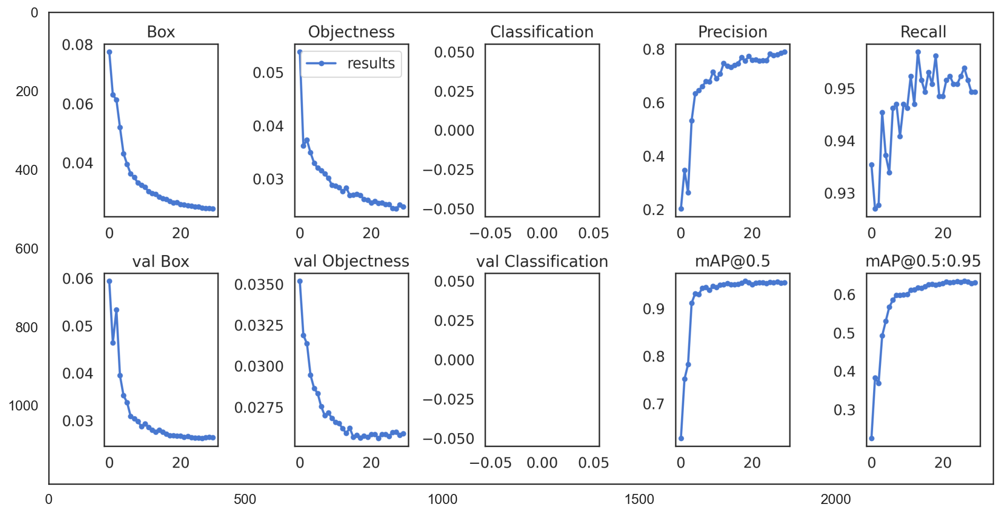

In [13]:
plt.imshow(plt.imread('../exp/yolo5x_cars/results.png'))
plt.show()

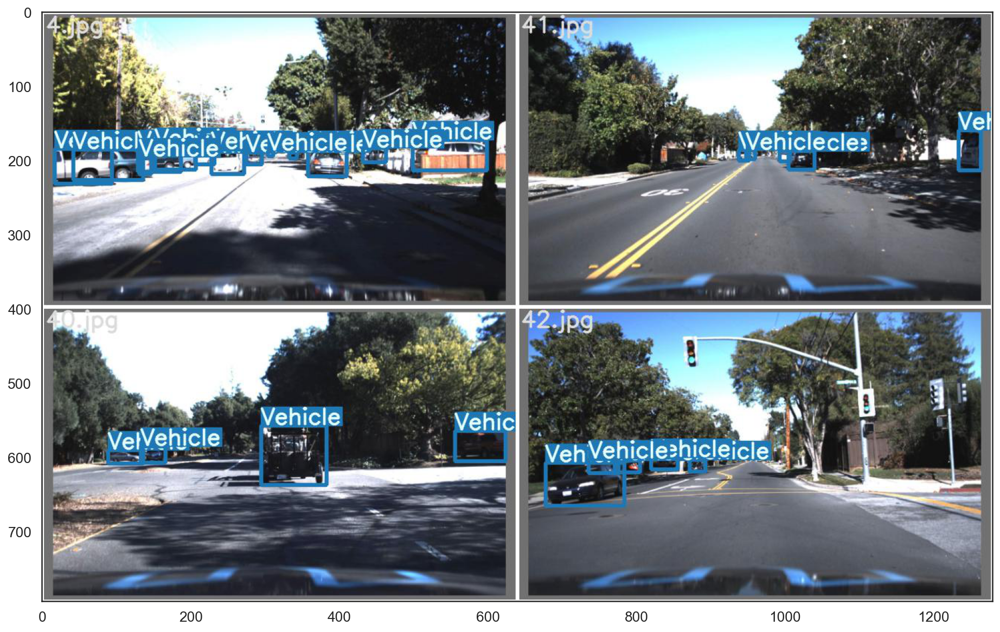

In [14]:
plt.imshow(plt.imread('../exp/yolo5x_cars/test_batch2_labels.jpg'))
plt.show()

### use the detect.py script to run our model on the images.

* weights ../exp/yolo5x_cars/weights/best.pt - checkpoint of the 30 epoch model
* img 640 - resize the images to 640x640 px
* conf 0.7 - take into account predictions with confidence of 0.7 or higher
* source ../inference/images/ - path to the images
* --save-txt save predictions to text file
* --save-conf save the confidnce

In [22]:
!python detect.py --weights ../exp/yolo5x_cars/weights/best.pt \
  --img 640 --conf 0.7 --source ../inference/images/ --save-txt --save-conf --exist-ok

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.7, device='', exist_ok=True, img_size=640, iou_thres=0.45, name='exp', project='runs/detect', save_conf=True, save_txt=True, source='../inference/images/', update=False, view_img=False, weights=['../exp/yolo5x_cars/weights/best.pt'])
Fusing layers... 
image 1/5 D:\VehicleDetection\inference\images\1479498371963069978.jpg: 416x640 8 Vehicles, Done. (0.107s)
image 2/5 D:\VehicleDetection\inference\images\1479506173994033498.jpg: 416x640 10 Vehicles, Done. (0.095s)
image 3/5 D:\VehicleDetection\inference\images\1479506174991516375.jpg: 416x640 9 Vehicles, Done. (0.096s)
image 4/5 D:\VehicleDetection\inference\images\1479506175971257681.jpg: 416x640 7 Vehicles, Done. (0.093s)
image 5/5 D:\VehicleDetection\inference\images\1479506176491553178.jpg: 416x640 7 Vehicles, Done. (0.092s)
Results saved to runs\detect\exp
5 labels saved to runs\detect\exp\labels
Done. (0.977s)


YOLOv5 v4.0-14-gb75c432 torch 1.7.1 CUDA:0 (GeForce GTX 1060 6GB, 6144.0MB)

Model Summary: 476 layers, 87198694 parameters, 0 gradients, 217.1 GFLOPS


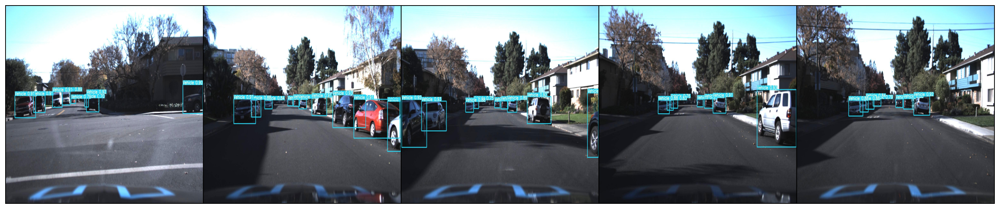

In [26]:
def load_image(img_path: Path, resize=True):
  img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (512, 512), interpolation = cv2.INTER_AREA)
  return img

def show_grid(image_paths):
  images = [load_image(img) for img in image_paths]
  images = torch.as_tensor(images)
  images = images.permute(0, 3, 1, 2)
  grid_img = torchvision.utils.make_grid(images, nrow=5)
  plt.figure(figsize=(24, 24))
  plt.imshow(grid_img.permute(1, 2, 0))
  plt.axis('off');

img_paths = list(Path("./runs/detect/exp").glob("*.jpg"))
show_grid(img_paths)

# Save results to Json file 
pascal voc format

In [34]:
import json

def yolo2voc(image_height, image_width, bboxes):
    """
    yolo => [xmid, ymid, w, h] (normalized)
    voc  => [x1, y1, x2, y2]  
    """ 
    bboxes = bboxes.copy().astype(float)
    
    bboxes[..., [0, 2]] = bboxes[..., [0, 2]]* image_width
    bboxes[..., [1, 3]] = bboxes[..., [1, 3]]* image_height
    
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] - bboxes[..., [2, 3]]/2
    bboxes[..., [2, 3]] = bboxes[..., [0, 1]] + bboxes[..., [2, 3]]
    
    return bboxes

result = {}

h,w = IMAGE_SIZE[:2]
for label_path in glob('./runs/detect/exp/labels/*txt'):

    image_id = label_path.split('\\')[-1].split('.')[0]
    result[image_id] = {}
    f = open(label_path, 'r')
    raw_data = np.array(f.read().replace('\n', ' ').strip().split(' ')).astype(np.float32).reshape(-1, 6)
    raw_data = raw_data[:, [0, 5, 1, 2, 3, 4]]
    raw_data = np.concatenate((raw_data[:, :2], np.round(yolo2voc(h, w, raw_data[:, 2:]))), axis =1)
    for idx,data in enumerate(raw_data):
        result[image_id][idx] = {'class': data[0], 
                                'confidence': data[1],
                                'bbox':{ 'xmin' : int(data[2]),
                                         'ymin' : int(data[3]),
                                         'xmax' : int(data[4]), 
                                         'ymax' : int(data[5])}
                                }

    f.close()
with open('results.json', 'w', encoding='utf-8') as f:
    json.dump(result, f, ensure_ascii=False, indent=4)


In [35]:
!type results.json

{
    "1479498371963069978": {
        "0": {
            "class": 0.0,
            "confidence": 0.7036129832267761,
            "bbox": {
                "xmin": 767,
                "ymin": 561,
                "xmax": 804,
                "ymax": 615
            }
        },
        "1": {
            "class": 0.0,
            "confidence": 0.7851560115814209,
            "bbox": {
                "xmin": 635,
                "ymin": 564,
                "xmax": 680,
                "ymax": 593
            }
        },
        "2": {
            "class": 0.0,
            "confidence": 0.8852540254592896,
            "bbox": {
                "xmin": 548,
                "ymin": 520,
                "xmax": 626,
                "ymax": 602
            }
        },
        "3": {
            "class": 0.0,
            "confidence": 0.9033200144767761,
            "bbox": {
                "xmin": 1724,
                "ymin": 478,
                "xmax": 1920,
                "ymax": 

# Detection on video

In [37]:
!python detect.py --source ../inference/videos/test.mp4 \
            --weights ../exp/yolo5x_cars/weights/best.pt \
             --img 640 --conf 0.4 --save-txt --save-conf --exist-ok

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=True, img_size=640, iou_thres=0.45, name='exp', project='runs/detect', save_conf=True, save_txt=True, source='../inference/videos/test.mp4', update=False, view_img=False, weights=['../exp/yolo5x_cars/weights/best.pt'])
Fusing layers... 
video 1/1 (1/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 Done. (0.091s)
video 1/1 (2/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 Done. (0.090s)
video 1/1 (3/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 2 Vehicles, Done. (0.091s)
video 1/1 (4/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 2 Vehicles, Done. (0.081s)
video 1/1 (5/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 2 Vehicles, Done. (0.082s)
video 1/1 (6/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 2 Vehicles, Done. (0.082s)
video 1/1 (7/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 2 Vehicles, Done. (

YOLOv5 v4.0-14-gb75c432 torch 1.7.1 CUDA:0 (GeForce GTX 1060 6GB, 6144.0MB)

Model Summary: 476 layers, 87198694 parameters, 0 gradients, 217.1 GFLOPS


video 1/1 (114/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 3 Vehicles, Done. (0.082s)
video 1/1 (115/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 3 Vehicles, Done. (0.082s)
video 1/1 (116/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 3 Vehicles, Done. (0.086s)
video 1/1 (117/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 3 Vehicles, Done. (0.085s)
video 1/1 (118/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 3 Vehicles, Done. (0.087s)
video 1/1 (119/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 3 Vehicles, Done. (0.085s)
video 1/1 (120/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 3 Vehicles, Done. (0.082s)
video 1/1 (121/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 4 Vehicles, Done. (0.082s)
video 1/1 (122/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 4 Vehicles, Done. (0.082s)
video 1/1 (123/995) D:\VehicleDetection\inference\videos\test.mp4: 384x640 4 Vehic

Done. (98.996s)


In [47]:
from ipywidgets import interact
import ffmpeg
import ipywidgets as widgets

vid_path = './runs/detect/exp/test.mp4'

In [48]:
probe = ffmpeg.probe(vid_path)
video_info = next(s for s in probe['streams'] if s['codec_type'] == 'video')
width = int(video_info['width'])
height = int(video_info['height'])
num_frames = int(video_info['nb_frames'])

In [49]:
out, err = (
    ffmpeg
    .input(vid_path)
    .output('pipe:', format='rawvideo', pix_fmt='rgb24')
    .run(capture_stdout=True)
)
video = (
    np
    .frombuffer(out, np.uint8)
    .reshape([-1, height, width, 3])
)

@interact(frame=(0, num_frames))
def show_frame(frame=0):
    plt.imshow(video[frame,:,:,:])

interactive(children=(IntSlider(value=0, description='frame', max=995), Output()), _dom_classes=('widget-inter…